# Harvard Classics
* DS5001: Exploratory Text Analytics
* Name: Derek Liu
* Email: hdl5hz@virginia.edu
* Date: May 11, 2021

The Harvard Classics - Originally known as Dr.Eliot's Five-Foot Shelf of Books, is a collection made by Charles William Eliot, former president of Harvard University. The collection was at a time marketed as similar to receiving a liberal arts education from Harvard University. 

Project Gutenberg has converted a large majority of the collection into individually readable books in many formats, including the .txt format that could be used to aggregate a corpus for this project.

Since The Harvard Classics is a collection of literature, each of the 50 volumes is a sub-collection of books Dr. Eliot put together. In this project, we will focus on texts that are within this collection, and are also downloaded more than 1,000 times on Project Gutenberg. 

Note: There is a complete collection of all 50 volumes on archive.org. However, through exploratory investigation of that collection, it is clear that the conversion was not a manual and synchronous process, but rather very different processes used by different organizations. Most of the texts are also converted into the .txt format through a .djvu format, and contains many scanning / OCR errors in the source files, which makes parsing through the files as well as analysis several degrees more difficult than Project Gutenberg's individual texts collection. 

There are 39 total texts from the Harvard Classics that are also downloaded at least 1,000 times. There are 22 that were successfully converted into the F1 format. Through the project, the main question of interest is what are the main characteristics of these texts, and how well does it represent a liberal arts education in the early 1900s at Harvard University.
    

In [1]:
data_in = './data_in'
data_out = './data_out'

In [408]:
import pandas as pd
import numpy as np
from glob import glob
import re
import nltk
import seaborn as sns
import plotly_express as px
from sklearn.decomposition import PCA
from scipy.linalg import norm

In [3]:
OHCO = ['book_id', 'chap_num', 'para_num', 'sent_num', 'token_num']

In [4]:
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')
nltk.download('stopwords')
nltk.download('tagsets')

[nltk_data] Downloading package punkt to
[nltk_data]     /Users/haoxuanliu/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /Users/haoxuanliu/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/haoxuanliu/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package tagsets to
[nltk_data]     /Users/haoxuanliu/nltk_data...
[nltk_data]   Package tagsets is already up-to-date!


True

## CREATING CORE TABLES - VOCAB, TOKEN, LIB, BOW

In [244]:
roman = '[IVXLCM]+'
caps = "[A-Z';, -]+"
low = "[A-Za-z';, -]+"
nums = "[0-9]+"
chap_pats = {
    766: {
        'start_line': 192,
        'end_line': 38227,
        'volume': re.compile('^\s*BOOK\s+{}\s*$'.format(nums)),
        'chapter': re.compile('^\s*CHAPTER\s+{}'.format(nums))
    },
    3300: {
        'start_line': 215,
        'end_line': 34576,
        'volume': re.compile('^\s*BOOK\s+{}\s*$'.format(roman)),
        'chapter': re.compile('^\s*CHAPTER\s+{}\.'.format(roman))
    },
    599: {
        'start_line': 183,
        'end_line': 30041,
        'volume': re.compile('^\s*BOOK\s+{}\s*$'.format(roman)),
        'chapter': re.compile('^\s*CHAPTER\s+{}'.format(roman))
    },
    59: {
        'start_line': 58,
        'end_line': 2016,
        'volume': re.compile('^\s*BOOK\s+{}\s*$'.format(roman)),
        'chapter': re.compile('^\s*PART\s+{}'.format(roman))
    },
    944: {
        'start_line': 124,
        'end_line': 19001,
        'volume': re.compile('^\s*BOOK\s+{}\s*$'.format(roman)),
        'chapter': re.compile('^\s*CHAPTER\s+{}'.format(roman))
    },    
    996: {
        'start_line': 2640,
        'end_line': 42908,
        'volume': re.compile('^\s*BOOK\s+{}\s*$'.format(roman)),
        'chapter': re.compile('^\s*CHAPTER\s+{}\.'.format(roman))
    },
    1228: {
        'start_line': 481,
        'end_line': 14637,
        'volume': re.compile('^\s*BOOK\s+{}\s*$'.format(roman)),
        'chapter': re.compile('^\s*CHAPTER\s+{}\.'.format(roman))
    },
    1232: {
        'start_line': 544,
        'end_line': 4827,
        'volume': re.compile('^\s*BOOK\s+{}\s*$'.format(roman)),
        'chapter': re.compile('^\s*CHAPTER\s+{}\.'.format(roman))
    },
    1342: {
        'start_line': 162,
        'end_line': 14226,
        'volume': re.compile('^\s*BOOK\s+{}\s*$'.format(roman)),
        'chapter': re.compile('^\s*Chapter\s+{}'.format(nums))
    },
    1399: {
        'start_line': 51,
        'end_line': 39873,
        'volume': re.compile('^\s*PART\s+{}\s*$'.format(caps)),
        'chapter': re.compile('^\s*Chapter\s+{}'.format(nums))
    },
    1597: {
        'start_line': 60,
        'end_line': 5842,
        'volume': re.compile('^\s*BOOK\s+{}\s*$'.format(roman)),
        'chapter': re.compile('^\s*THE\s+{}\s*$'.format(caps))
    },
    1656: {
        'start_line': 60,
        'end_line': 5842,
        'volume': re.compile('^\s*BOOK\s+{}\s*$'.format(roman)),
        'chapter': re.compile('^\s*APOLOGY+\s$')
    },
    1727: {
        'start_line': 373,
        'end_line': 11891,
        'volume': re.compile('^\s*BOOK\s+{}\s*$'.format(roman)),
        'chapter': re.compile('^\s*BOOK\s+{}'.format(roman))
    },
    1929: {
        'start_line': 317,
        'end_line': 4758,
        'volume': re.compile('^\s*ACT\s+{}\s*$'.format(roman)),
        'chapter': re.compile('^\s*SCENE\s+{}'.format(roman))
    },
    2130: {
        'start_line': 184,
        'end_line': 3687,
        'volume': re.compile('^\s*BOOK\s+{}\s*$'.format(roman)),
        'chapter': re.compile('\s*OF\s+{}\s*$'.format(caps))
    },
    2232: {
        'start_line': 103,
        'end_line': 4905,
        'volume': re.compile('^\s*ACT\s+{}\s*$'.format(roman)),
        'chapter': re.compile('^\s*SCENE\s+{}'.format(roman))
    },
    2527: {
        'start_line': 61,
        'end_line': 4084,
        'volume': re.compile('^\s*BOOK\s+{}\s*\.'.format(roman)),
        'chapter': re.compile("[A-Z';, -]+\s+[0-9]+\s*\.".format(roman))
    },
    2554: {
        'start_line': 127,
        'end_line': 22094,
        'volume': re.compile('^\s*PART\s+{}\s*$'.format(roman)),
        'chapter': re.compile('^\s*CHAPTER\s+{}'.format(roman))
    },
    2610: {
        'start_line': 289,
        'end_line': 22841,
        'volume': re.compile('^\s*BOOK\s+{}\s*\.'.format(caps)),
        'chapter': re.compile('^\s*CHAPTER\s+{}\.'.format(roman))
    },
    3207: {
        'start_line': 384,
        'end_line': 5733,
        'volume': re.compile('^\s*PART\s+{}\.'.format(roman)),
        'chapter': re.compile('^\s*CHAPTER\s+{}\.'.format(roman))
    },
    3296: {
        'start_line': 49,
        'end_line': 9372,
        'volume': re.compile('^\s*PART\s+{}\.'.format(roman)),
        'chapter': re.compile('^\s*BOOK\s+'.format(roman))
    },
    18269: {
        'start_line': 571,
        'end_line': 13776,
        'volume': re.compile('^\s*PART\s+{}\.'.format(roman)),
        'chapter': re.compile('^\s*SECTION\s+'.format(roman))
    }
}

In [245]:
def acquire_epubs(epub_list, chap_pats, OHCO=OHCO):
    
    my_lib = []
    my_doc = []

    for epub_file in epub_list:
        
        # Get PG ID from filename
        book_id = int(epub_file.split('-')[0].split('/')[2])
        print("BOOK ID", book_id)
        
        # Import file as lines
        lines = open(epub_file, 'r', encoding='utf-8-sig').readlines()
        df = pd.DataFrame(lines, columns=['line_str'])
        df.index.name = 'line_num'
#         df.line_str = df.line_str.str.strip()
        df['book_id'] = book_id
        
        # FIX CHARACTERS TO IMPROVE TOKENIZATION
        df.line_str = df.line_str.str.replace('—', ' — ')
        df.line_str = df.line_str.str.replace('-', ' - ')
        
        # Get book title and put into LIB table -- note problems, though
        book_title = re.sub(r"The Project Gutenberg eBook( of|,) ", "", df.loc[0].line_str, flags=re.IGNORECASE)
        book_title = re.sub(r"Project Gutenberg's ", "", book_title, flags=re.IGNORECASE)
        
        # Remove cruft
        a = chap_pats[book_id]['start_line'] - 1
        b = chap_pats[book_id]['end_line'] + 1
        df = df.iloc[a:b]
        
        # Chunk by chapter
        chap_lines = df.line_str.str.match(chap_pats[book_id]['chapter'])
        chap_nums = [i+1 for i in range(df.loc[chap_lines].shape[0])]
        df.loc[chap_lines, 'chap_num'] = chap_nums
        df.chap_num = df.chap_num.ffill()

        # Clean up
#         df = df[~df.chap_num.isna()] 
        df = df.dropna(subset=['chap_num']) # Remove everything before Chapter 1
        df = df.loc[~chap_lines] # Remove chapter heading lines
        df['chap_num'] = df['chap_num'].astype('int')
        
        # Group -- Note that we exclude the book level in the OHCO at this point
        df = df.groupby(OHCO[1:2]).line_str.apply(lambda x: '\n'.join(x)).to_frame() # Make big string
        
        # Split into paragrpahs
        df = df['line_str'].astype(str).str.split(r'\n\n+', expand=True).stack().to_frame().rename(columns={0:'para_str'})
        df.index.names = OHCO[1:3] # MAY NOT BE NECESSARY UNTIL THE END
        df['para_str'] = df['para_str'].astype(str).str.replace(r'\n', ' ').str.strip()
        df = df[~df['para_str'].str.match(r'^\s*$')] # Remove empty paragraphs
        
        # Set index
        df['book_id'] = book_id
        df = df.reset_index().set_index(OHCO[:3])

        # Register
        my_lib.append((book_id, book_title, epub_file))
        my_doc.append(df)

    docs = pd.concat(my_doc)
    library = pd.DataFrame(my_lib, columns=['book_id', 'book_title', 'book_file']).set_index('book_id')
    return library, docs

In [246]:
epubs = [epub for epub in sorted(glob('{}/*.txt'.format(data_in)))] 
LIB, DOC = acquire_epubs(epubs, chap_pats)

BOOK ID 1228


<ipython-input-245-308808f289ae>:50: FutureWarning: The default value of regex will change from True to False in a future version.
  df['para_str'] = df['para_str'].astype(str).str.replace(r'\n', ' ').str.strip()
<ipython-input-245-308808f289ae>:50: FutureWarning: The default value of regex will change from True to False in a future version.
  df['para_str'] = df['para_str'].astype(str).str.replace(r'\n', ' ').str.strip()


BOOK ID 1232
BOOK ID 1342


<ipython-input-245-308808f289ae>:50: FutureWarning: The default value of regex will change from True to False in a future version.
  df['para_str'] = df['para_str'].astype(str).str.replace(r'\n', ' ').str.strip()


BOOK ID 1399


<ipython-input-245-308808f289ae>:50: FutureWarning: The default value of regex will change from True to False in a future version.
  df['para_str'] = df['para_str'].astype(str).str.replace(r'\n', ' ').str.strip()


BOOK ID 1597
BOOK ID 1656


<ipython-input-245-308808f289ae>:50: FutureWarning: The default value of regex will change from True to False in a future version.
  df['para_str'] = df['para_str'].astype(str).str.replace(r'\n', ' ').str.strip()
<ipython-input-245-308808f289ae>:50: FutureWarning: The default value of regex will change from True to False in a future version.
  df['para_str'] = df['para_str'].astype(str).str.replace(r'\n', ' ').str.strip()


BOOK ID 1727


<ipython-input-245-308808f289ae>:50: FutureWarning: The default value of regex will change from True to False in a future version.
  df['para_str'] = df['para_str'].astype(str).str.replace(r'\n', ' ').str.strip()


BOOK ID 18269


<ipython-input-245-308808f289ae>:50: FutureWarning: The default value of regex will change from True to False in a future version.
  df['para_str'] = df['para_str'].astype(str).str.replace(r'\n', ' ').str.strip()
<ipython-input-245-308808f289ae>:50: FutureWarning: The default value of regex will change from True to False in a future version.
  df['para_str'] = df['para_str'].astype(str).str.replace(r'\n', ' ').str.strip()
<ipython-input-245-308808f289ae>:50: FutureWarning: The default value of regex will change from True to False in a future version.
  df['para_str'] = df['para_str'].astype(str).str.replace(r'\n', ' ').str.strip()


BOOK ID 1929
BOOK ID 2130
BOOK ID 2232


<ipython-input-245-308808f289ae>:50: FutureWarning: The default value of regex will change from True to False in a future version.
  df['para_str'] = df['para_str'].astype(str).str.replace(r'\n', ' ').str.strip()
<ipython-input-245-308808f289ae>:50: FutureWarning: The default value of regex will change from True to False in a future version.
  df['para_str'] = df['para_str'].astype(str).str.replace(r'\n', ' ').str.strip()


BOOK ID 2527
BOOK ID 2554


<ipython-input-245-308808f289ae>:50: FutureWarning: The default value of regex will change from True to False in a future version.
  df['para_str'] = df['para_str'].astype(str).str.replace(r'\n', ' ').str.strip()


BOOK ID 2610


<ipython-input-245-308808f289ae>:50: FutureWarning: The default value of regex will change from True to False in a future version.
  df['para_str'] = df['para_str'].astype(str).str.replace(r'\n', ' ').str.strip()
<ipython-input-245-308808f289ae>:50: FutureWarning: The default value of regex will change from True to False in a future version.
  df['para_str'] = df['para_str'].astype(str).str.replace(r'\n', ' ').str.strip()


BOOK ID 3207
BOOK ID 3296


<ipython-input-245-308808f289ae>:50: FutureWarning: The default value of regex will change from True to False in a future version.
  df['para_str'] = df['para_str'].astype(str).str.replace(r'\n', ' ').str.strip()


BOOK ID 3300


<ipython-input-245-308808f289ae>:50: FutureWarning: The default value of regex will change from True to False in a future version.
  df['para_str'] = df['para_str'].astype(str).str.replace(r'\n', ' ').str.strip()
<ipython-input-245-308808f289ae>:50: FutureWarning: The default value of regex will change from True to False in a future version.
  df['para_str'] = df['para_str'].astype(str).str.replace(r'\n', ' ').str.strip()


BOOK ID 59
BOOK ID 599


<ipython-input-245-308808f289ae>:50: FutureWarning: The default value of regex will change from True to False in a future version.
  df['para_str'] = df['para_str'].astype(str).str.replace(r'\n', ' ').str.strip()


BOOK ID 766


<ipython-input-245-308808f289ae>:50: FutureWarning: The default value of regex will change from True to False in a future version.
  df['para_str'] = df['para_str'].astype(str).str.replace(r'\n', ' ').str.strip()


BOOK ID 944
BOOK ID 996


<ipython-input-245-308808f289ae>:50: FutureWarning: The default value of regex will change from True to False in a future version.
  df['para_str'] = df['para_str'].astype(str).str.replace(r'\n', ' ').str.strip()
<ipython-input-245-308808f289ae>:50: FutureWarning: The default value of regex will change from True to False in a future version.
  df['para_str'] = df['para_str'].astype(str).str.replace(r'\n', ' ').str.strip()


In [247]:
LIB

,book_title,book_file
book_id,,
1228,"On the Origin of Species, by Charles Darwin\n",./data_in/1228-0.txt
1232,"The Prince, by Nicolo Machiavelli\n",./data_in/1232-0.txt
1342,"Pride and Prejudice, by Jane Austen\n",./data_in/1342-0.txt
1399,"Anna Karenina, by Leo Tolstoy\n",./data_in/1399-0.txt
1597,"Andersen's Fairy Tales, by Hans Christian Ande...",./data_in/1597-0.txt
1656,"Apology, by Plato\n",./data_in/1656-0.txt
1727,"The Odyssey, by Homer\n",./data_in/1727-0.txt
18269,"Pascal's Pensées, by Blaise Pascal\n",./data_in/18269-0.txt
1929,"The School For Scandal, by Richard Brinsley Sh...",./data_in/1929-0.txt


In [249]:
DOC

para_str
book_id chap_num para_num                                                   
1228    1        0                            VARIATION UNDER DOMESTICATION.
                 1         Causes of Variability. Effects of Habit. Corre...
                 2         Inheritance. Character of Domestic Varieties. ...
                 3         distinguishing between Varieties and Species. ...
                 4         Varieties from one or more Species. Domestic P...
...                                                                      ...
996     126      223       mankind the false and foolish tales of the boo...
                 224       thanks to that of my true Don Quixote, are eve...
                 225           doubtless doomed to fall for ever. Farewell.”
                 226                                          p74e.jpg (49K)
                 227                                               Full Size

[288900 rows x 1 columns]

In [250]:
def tokenize(doc_df, OHCO=OHCO, remove_pos_tuple=False, ws=False):
    
    # Paragraphs to Sentences
    df = doc_df.para_str\
        .apply(lambda x: pd.Series(nltk.sent_tokenize(x)))\
        .stack()\
        .to_frame()\
        .rename(columns={0:'sent_str'})
    
    # Sentences to Tokens
    # Local function to pick tokenizer
    def word_tokenize(x):
        if ws:
            s = pd.Series(nltk.pos_tag(nltk.WhitespaceTokenizer().tokenize(x)))
        else:
            s = pd.Series(nltk.pos_tag(nltk.word_tokenize(x)))
        return s
            
    df = df.sent_str\
        .apply(word_tokenize)\
        .stack()\
        .to_frame()\
        .rename(columns={0:'pos_tuple'})
    
    # Grab info from tuple
    df['pos'] = df.pos_tuple.apply(lambda x: x[1])
    df['token_str'] = df.pos_tuple.apply(lambda x: x[0])
    if remove_pos_tuple:
        df = df.drop('pos_tuple', 1)
    
    # Add index
    df.index.names = OHCO
    
    return df

In [251]:
TOKEN = tokenize(DOC, ws=False)
TOKEN.head()

pos_tuple  pos  \
book_id chap_num para_num sent_num token_num                              
1228    1        0        0        0              (VARIATION, NNP)  NNP   
                                   1                  (UNDER, NNP)  NNP   
                                   2          (DOMESTICATION, NNP)  NNP   
                                   3                        (., .)    .   
                 1        0        0                 (Causes, NNS)  NNS   

                                                  token_str  
book_id chap_num para_num sent_num token_num                 
1228    1        0        0        0              VARIATION  
                                   1                  UNDER  
                                   2          DOMESTICATION  
                                   3                      .  
                 1        0        0                 Causes

In [254]:
token.shape

(3958250, 4)

In [321]:
TOKEN['term_str'] = TOKEN['token_str'].str.lower().str.replace('[\W_]', '')
VOCAB = TOKEN.term_str.value_counts().to_frame().rename(columns={'index':'term_str', 'term_str':'n'})\
    .sort_index().reset_index().rename(columns={'index':'term_str'})
VOCAB.index.name = 'term_id'
VOCAB['num'] = VOCAB.term_str.str.match("\d+").astype('int')
sw = pd.DataFrame(nltk.corpus.stopwords.words('english'),columns=['term_str'])
sw = sw.reset_index().set_index('term_str')
sw.columns = ["dummy"]
sw.dummy = 1
VOCAB['stop'] = VOCAB.term_str.map(sw.dummy)
VOCAB['stop'] = VOCAB['stop'].fillna(0).astype('int')
from nltk.stem.porter import PorterStemmer

stemmer = PorterStemmer()
VOCAB['p_stem'] = VOCAB.term_str.apply(stemmer.stem)
VOCAB

<ipython-input-321-7e52c4e69c05>:1: FutureWarning: The default value of regex will change from True to False in a future version.
  TOKEN['term_str'] = TOKEN['token_str'].str.lower().str.replace('[\W_]', '')


,term_str,n,num,stop,p_stem
term_id,,,,,
0,0,431,1,0,0
1,000,1,1,0,000
2,006,1,1,0,006
3,008,1,1,0,008
4,014,1,1,0,014
...,...,...,...,...,...
47774,ὡπλίσσατο,1,0,0,ὡπλίσσατο
47775,ὦς,2,0,0,ὦς
47776,ῥ,1,0,0,ῥ


In [257]:
data_prefix = "harvardclassics"
DOC.to_csv('{}/{}-DOC.csv'.format(data_out, data_prefix))
LIB.to_csv('{}/{}-LIB.csv'.format(data_out, data_prefix))
TOKEN.to_csv('{}/{}-TOKEN.csv'.format(data_out, data_prefix))

In [322]:
VOCAB.to_csv('{}/{}-VOCAB.csv'.format(data_out, data_prefix))

In [325]:
LIB = pd.read_csv("{}/{}-LIB.csv".format(data_out, data_prefix)).set_index(BOOKS)
TOKEN = pd.read_csv('{}/{}-TOKEN.csv'.format(data_out, data_prefix)).set_index(OHCO)
VOCAB = pd.read_csv('{}/{}-VOCAB.csv'.format(data_out, data_prefix)).set_index('term_id')

In [326]:
SENTS = OHCO[:4]
PARAS = OHCO[:3]
CHAPS = OHCO[:2]
BOOKS = OHCO[:1]

In [327]:
TOKEN.head()

pos_tuple  pos  \
book_id chap_num para_num sent_num token_num                                  
1228    1        0        0        0              ('VARIATION', 'NNP')  NNP   
                                   1                  ('UNDER', 'NNP')  NNP   
                                   2          ('DOMESTICATION', 'NNP')  NNP   
                                   3                        ('.', '.')    .   
                 1        0        0                 ('Causes', 'NNS')  NNS   

                                                  token_str       term_str  
book_id chap_num para_num sent_num token_num                                
1228    1        0        0        0              VARIATION      variation  
                                   1                  UNDER          under  
                                   2          DOMESTICATION  domestication  
                                   3                      .            NaN  
                 1        0        0                 Causes         causes

In [328]:
LIB.head()

,book_title,book_file,title,author
book_id,,,,
1228,"On the Origin of Species, by Charles Darwin\n",./data_in/1228-0.txt,On the Origin of Species,Charles Darwin\n
1232,"The Prince, by Nicolo Machiavelli\n",./data_in/1232-0.txt,The Prince,Nicolo Machiavelli\n
1342,"Pride and Prejudice, by Jane Austen\n",./data_in/1342-0.txt,Pride and Prejudice,Jane Austen\n
1399,"Anna Karenina, by Leo Tolstoy\n",./data_in/1399-0.txt,Anna Karenina,Leo Tolstoy\n
1597,"Andersen's Fairy Tales, by Hans Christian Ande...",./data_in/1597-0.txt,Andersen's Fairy Tales,Hans Christian Andersen\n


In [329]:
VOCAB.head()

,term_str,n,num,stop,p_stem
term_id,,,,,
0,0,431,1,0,0
1,000,1,1,0,000
2,006,1,1,0,006
3,008,1,1,0,008
4,014,1,1,0,014


In [330]:
VOCAB = VOCAB.dropna()
TOKEN = TOKEN.dropna()

In [331]:
VOCAB.reset_index().set_index('term_str').term_id

term_str
0                0
000              1
006              2
008              3
014              4
             ...  
ὡπλίσσατο    47774
ὦς           47775
ῥ            47776
ῥα           47777
ῥῶγες        47778
Name: term_id, Length: 47779, dtype: int64

In [332]:
TOKEN['term_id'] = TOKEN.term_str.map(VOCAB.reset_index().set_index('term_str').term_id)

In [452]:
TOKEN.head()

pos_tuple  pos  \
book_id chap_num para_num sent_num token_num                                  
1228    1        0        0        0              ('VARIATION', 'NNP')  NNP   
                                   1                  ('UNDER', 'NNP')  NNP   
                                   2          ('DOMESTICATION', 'NNP')  NNP   
                 1        0        0                 ('Causes', 'NNS')  NNS   
                                   1                      ('of', 'IN')   IN   

                                                  token_str       term_str  \
book_id chap_num para_num sent_num token_num                                 
1228    1        0        0        0              VARIATION      variation   
                                   1                  UNDER          under   
                                   2          DOMESTICATION  domestication   
                 1        0        0                 Causes         causes   
                                   1                     of             of   

                                              term_id  
book_id chap_num para_num sent_num token_num           
1228    1        0        0        0            45488  
                                   1            44461  
                                   2            14455  
                 1        0        0             8459  
                                   1            29916

In [453]:
TOKEN.to_csv('{}/{}-TOKEN-2.csv'.format(data_out, data_prefix))

In [334]:
VOCAB['pos_max'] = TOKEN.groupby(['term_id', 'pos']).count().iloc[:,0].unstack().idxmax(1)

In [335]:
VOCAB.head()

,term_str,n,num,stop,p_stem,pos_max
term_id,,,,,,
0,0,431,1,0,0,CD
1,000,1,1,0,000,CD
2,006,1,1,0,006,NN
3,008,1,1,0,008,NNP
4,014,1,1,0,014,NNP


In [343]:
VOCAB.to_csv('{}/{}-VOCAB-2.csv'.format(data_out, data_prefix))

In [336]:
POS = TOKEN.pos.value_counts().to_frame().rename(columns={'pos':'n'})
POS.index.name = 'pos_id'

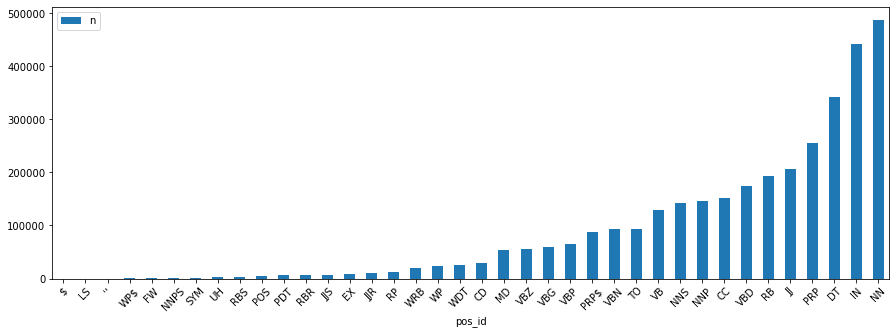

In [338]:
POS.sort_values('n').plot.bar(y='n', figsize=(15,5), rot=45);

In [339]:
POS_MAX = VOCAB.pos_max.value_counts().to_frame().rename(columns={'pos_max':'n'})
POS_MAX.index.name = 'pos_id'

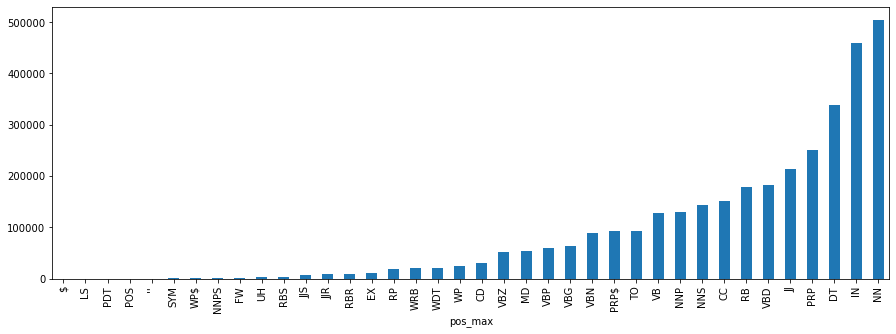

In [340]:
VOCAB.groupby('pos_max').n.sum().sort_values().plot.bar(figsize=(15,5));

In [341]:
POS['max_n'] = POS_MAX['n']

In [342]:
POS.head()

,n,max_n
pos_id,,
NN,487784,14655
IN,441684,129
DT,342455,22
PRP,254506,21
JJ,206429,4521


In [355]:
VOCAB = pd.read_csv(f'{data_out}/{data_prefix}-VOCAB-2.csv').dropna().set_index('term_str')

In [356]:
VOCAB.head()

,term_id,n,num,stop,p_stem,pos_max
term_str,,,,,,
0,0,431,1,0,0,CD
000,1,1,1,0,000,CD
006,2,1,1,0,006,NN
008,3,1,1,0,008,NNP
014,4,1,1,0,014,NNP


In [350]:
N_vocab = VOCAB.shape[0]
U_vocab = 1/N_vocab

In [357]:
VOCAB['p'] = VOCAB.n / VOCAB.n.sum()  # Probability
VOCAB['s'] = 1 / VOCAB.p              # Surprise
VOCAB['i'] = np.log2(VOCAB.s)         # Information
VOCAB['h'] = VOCAB.p * VOCAB.i       # Entropy

In [358]:
VOCAB = VOCAB.sort_values('n', ascending=False)
VOCAB['term_rank'] = [r+1 for r in range(VOCAB.shape[0])]

In [359]:
VOCAB

,term_id,n,num,stop,p_stem,pos_max,p,s,i,h,term_rank
term_str,,,,,,,,,,,
the,42585,187978,0,1,the,DT,5.628364e-02,1.776715e+01,4.151141,0.233641,1
and,3506,114310,0,1,and,CC,3.422625e-02,2.921734e+01,4.868753,0.166639,2
of,29916,112787,0,1,of,IN,3.377024e-02,2.961187e+01,4.888104,0.165072,3
to,43125,93291,0,1,to,TO,2.793283e-02,3.580017e+01,5.161895,0.144186,4
a,2016,63106,0,1,a,DT,1.889495e-02,5.292419e+01,5.725855,0.108190,5
...,...,...,...,...,...,...,...,...,...,...,...
augustines,4766,1,0,0,augustin,NNP,2.994161e-07,3.339834e+06,21.671345,0.000006,47775
augustins,4767,1,0,0,augustin,NNP,2.994161e-07,3.339834e+06,21.671345,0.000006,47776
augustinus,4768,1,0,0,augustinu,NNP,2.994161e-07,3.339834e+06,21.671345,0.000006,47777


In [360]:
AR = VOCAB.n.value_counts().to_frame('nn').sort_index(ascending=False) # Get counts of counts; n is now an index
AR['term_rank2'] = [r+1 for r in range(AR.shape[0])]                   # Assign list of ordered integers
VOCAB['term_rank2'] = VOCAB.n.map(AR.term_rank2)    

In [361]:
VOCAB

,term_id,n,num,stop,p_stem,pos_max,p,s,i,h,term_rank,term_rank2
term_str,,,,,,,,,,,,
the,42585,187978,0,1,the,DT,5.628364e-02,1.776715e+01,4.151141,0.233641,1,1
and,3506,114310,0,1,and,CC,3.422625e-02,2.921734e+01,4.868753,0.166639,2,2
of,29916,112787,0,1,of,IN,3.377024e-02,2.961187e+01,4.888104,0.165072,3,3
to,43125,93291,0,1,to,TO,2.793283e-02,3.580017e+01,5.161895,0.144186,4,4
a,2016,63106,0,1,a,DT,1.889495e-02,5.292419e+01,5.725855,0.108190,5,5
...,...,...,...,...,...,...,...,...,...,...,...,...
augustines,4766,1,0,0,augustin,NNP,2.994161e-07,3.339834e+06,21.671345,0.000006,47775,1005
augustins,4767,1,0,0,augustin,NNP,2.994161e-07,3.339834e+06,21.671345,0.000006,47776,1005
augustinus,4768,1,0,0,augustinu,NNP,2.994161e-07,3.339834e+06,21.671345,0.000006,47777,1005


## VOCAB ZIPF

In [362]:
VOCAB['zipf_k'] = VOCAB.n * VOCAB.term_rank
ZK = round(VOCAB.zipf_k.mean(), 2)

In [363]:
ZK

104061.57

In [364]:
VOCAB['zipf_y'] = ZK / VOCAB.term_rank

In [367]:
px.scatter(VOCAB, 'term_rank', 'zipf_y', log_x=True)

In [370]:
rank_index = [i for i in range(1, 10)]\
    + [i for i in range(10, 100, 10)]\
    + [i for i in range(100, 1000, 100)]\
    + [i for i in range(1000,10000,1000)]
DEMO = VOCAB.loc[VOCAB.term_rank.isin(rank_index), ['term_rank', 'term_rank2', 'p', 'zipf_k', 'pos_max']]

In [371]:
DEMO.style.background_gradient(cmap='GnBu', high=.5)

,term_rank,term_rank2,p,zipf_k,pos_max
term_str,,,,,
the,1,1,0.056284,187978,DT
and,2,2,0.034226,228620,CC
of,3,3,0.033770,338361,IN
to,4,4,0.027933,373164,TO
a,5,5,0.018895,315530,DT
in,6,6,0.018390,368526,IN
i,7,7,0.014442,337638,PRP
that,8,8,0.014115,377136,IN
it,9,9,0.012160,365508,PRP


In [372]:
DOC = OHCO[:2] # Chapter



In [373]:
DOC

['book_id', 'chap_num']

In [374]:
BOW = TOKEN.groupby(DOC+['term_str']).term_str.count().to_frame('tf_n')

In [375]:
BOW.sample(10)

,,,tf_n
book_id,chap_num,term_str,
2554,28,grew,1
599,41,revisited,1
766,16,coat,1
996,49,back,4
1232,6,as,8
766,45,sense,3
599,41,bed,1
3300,30,neighbourhood,6
944,18,alongside,1


In [376]:
D = BOW.groupby(DOC).tf_n
BOW['tf_jp'] = D.apply(lambda x: x / x.sum().sum()) # jp = P(w,d)
BOW['tf_cp'] = D.apply(lambda x: x / x.sum()) # cp = P(w|d)
BOW['tf_l2'] = D.apply(lambda x: x / np.sqrt((x**2).sum()))
BOW['tf_logn'] = D.apply(lambda x: np.log2(1 + x))
BOW['tf_sub'] = D.apply(lambda x: 1 + np.log2(x)) # Sublinear scaling; from Manning, et al.
BOW['tf_max'] = D.apply(lambda x: .4 + .6 * (x / x.max())) # See Manning, et al. for choice of α
BOW['tf_bool'] = D.apply(lambda x: x.astype('bool') / x.astype('bool').sum())

In [377]:
tf_types = [col.split('_')[1] for col in BOW.columns.to_list() if 'tf_' in col]

In [378]:
BOW

tf_n     tf_jp     tf_cp     tf_l2   tf_logn  \
book_id chap_num term_str                                                    
59      1        a              27  0.010235  0.010235  0.087558  4.807355   
                 abandoned       1  0.000379  0.000379  0.003243  1.000000   
                 aberrations     1  0.000379  0.000379  0.003243  1.000000   
                 able            3  0.001137  0.001137  0.009729  2.000000   
                 abounding       1  0.000379  0.000379  0.003243  1.000000   
...                            ...       ...       ...       ...       ...   
18269   14       yield           1  0.000202  0.000202  0.001794  1.000000   
                 you            37  0.007458  0.007458  0.066384  5.247928   
                 your            1  0.000202  0.000202  0.001794  1.000000   
                 yourselves      2  0.000403  0.000403  0.003588  1.584963   
                 zeal            5  0.001008  0.001008  0.008971  2.584963   

                                tf_sub    tf_max   tf_bool  
book_id chap_num term_str                                   
59      1        a            5.754888  0.505195  0.001205  
                 abandoned    1.000000  0.403896  0.001205  
                 aberrations  1.000000  0.403896  0.001205  
                 able         2.584963  0.411688  0.001205  
                 abounding    1.000000  0.403896  0.001205  
...                                ...       ...       ...  
18269   14       yield        1.000000  0.401681  0.000813  
                 you          6.209453  0.462185  0.000813  
                 your         1.000000  0.401681  0.000813  
                 yourselves   2.000000  0.403361  0.000813  
                 zeal         3.321928  0.408403  0.000813  

[824982 rows x 8 columns]

In [379]:
VOCAB['df'] = BOW.groupby('term_str').tf_n.count()
N_docs = len(D.groups)
VOCAB['idf'] = np.log2(N_docs/VOCAB.df)

In [380]:
VOCAB

,term_id,n,num,stop,p_stem,pos_max,p,s,i,h,term_rank,term_rank2,zipf_k,zipf_y,df,idf
term_str,,,,,,,,,,,,,,,,
the,42585,187978,0,1,the,DT,5.628364e-02,1.776715e+01,4.151141,0.233641,1,1,187978,104061.570000,944,0.004578
and,3506,114310,0,1,and,CC,3.422625e-02,2.921734e+01,4.868753,0.166639,2,2,228620,52030.785000,945,0.003050
of,29916,112787,0,1,of,IN,3.377024e-02,2.961187e+01,4.888104,0.165072,3,3,338361,34687.190000,939,0.012239
to,43125,93291,0,1,to,TO,2.793283e-02,3.580017e+01,5.161895,0.144186,4,4,373164,26015.392500,943,0.006107
a,2016,63106,0,1,a,DT,1.889495e-02,5.292419e+01,5.725855,0.108190,5,5,315530,20812.314000,938,0.013777
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
augustines,4766,1,0,0,augustin,NNP,2.994161e-07,3.339834e+06,21.671345,0.000006,47775,1005,47775,2.178159,1,9.887221
augustins,4767,1,0,0,augustin,NNP,2.994161e-07,3.339834e+06,21.671345,0.000006,47776,1005,47776,2.178114,1,9.887221
augustinus,4768,1,0,0,augustinu,NNP,2.994161e-07,3.339834e+06,21.671345,0.000006,47777,1005,47777,2.178068,1,9.887221


In [381]:
for tf_type in tf_types:
    BOW[f'tfidf_{tf_type}'] = BOW[f'tf_{tf_type}'] * VOCAB.idf

In [382]:
BOW

tf_n     tf_jp     tf_cp     tf_l2   tf_logn  \
book_id chap_num term_str                                                    
59      1        a              27  0.010235  0.010235  0.087558  4.807355   
                 abandoned       1  0.000379  0.000379  0.003243  1.000000   
                 aberrations     1  0.000379  0.000379  0.003243  1.000000   
                 able            3  0.001137  0.001137  0.009729  2.000000   
                 abounding       1  0.000379  0.000379  0.003243  1.000000   
...                            ...       ...       ...       ...       ...   
18269   14       yield           1  0.000202  0.000202  0.001794  1.000000   
                 you            37  0.007458  0.007458  0.066384  5.247928   
                 your            1  0.000202  0.000202  0.001794  1.000000   
                 yourselves      2  0.000403  0.000403  0.003588  1.584963   
                 zeal            5  0.001008  0.001008  0.008971  2.584963   

                                tf_sub    tf_max   tf_bool    tfidf_n  \
book_id chap_num term_str                                               
59      1        a            5.754888  0.505195  0.001205   0.371966   
                 abandoned    1.000000  0.403896  0.001205   3.677767   
                 aberrations  1.000000  0.403896  0.001205   8.302258   
                 able         2.584963  0.411688  0.001205   4.079231   
                 abounding    1.000000  0.403896  0.001205   5.887221   
...                                ...       ...       ...        ...   
18269   14       yield        1.000000  0.401681  0.000813   3.460956   
                 you          6.209453  0.462185  0.000813   7.686399   
                 your         1.000000  0.401681  0.000813   0.523086   
                 yourselves   2.000000  0.403361  0.000813   8.727317   
                 zeal         3.321928  0.408403  0.000813  24.214132   

                              tfidf_jp  tfidf_cp  tfidf_l2  tfidf_logn  \
book_id chap_num term_str                                                
59      1        a            0.000141  0.000141  0.001206    0.066229   
                 abandoned    0.001394  0.001394  0.011927    3.677767   
                 aberrations  0.003147  0.003147  0.026923    8.302258   
                 able         0.001546  0.001546  0.013229    2.719487   
                 abounding    0.002232  0.002232  0.019092    5.887221   
...                                ...       ...       ...         ...   
18269   14       yield        0.000698  0.000698  0.006210    3.460956   
                 you          0.001549  0.001549  0.013791    1.090207   
                 your         0.000105  0.000105  0.000939    0.523086   
                 yourselves   0.001759  0.001759  0.015658    6.916235   
                 zeal         0.004881  0.004881  0.043444   12.518525   

                              tfidf_sub  tfidf_max  tfidf_bool  
book_id chap_num term_str                                       
59      1        a             0.079282   0.006960    0.000017  
                 abandoned     3.677767   1.485436    0.004431  
                 aberrations   8.302258   3.353250    0.010003  
                 able          3.514886   0.559791    0.001638  
                 abounding     5.887221   2.377825    0.007093  
...                                 ...        ...         ...  
18269   14       yield         3.460956   1.390199    0.002814  
                 you           1.289955   0.096015    0.000169  
                 your          0.523086   0.210114    0.000425  
                 yourselves    8.727317   1.760131    0.003548  
                 zeal         16.087521   1.977827    0.003937  

[824982 rows x 16 columns]

In [383]:
for tf_type in tf_types:
    col = f"tfidf_{tf_type}"
    VOCAB[col + "_sum"] = BOW.groupby('term_str')[col].sum()
    VOCAB[col + "_sum"] = (VOCAB[col + "_sum"] - VOCAB[col + "_sum"].mean()) / VOCAB[col + "_sum"].std()
    VOCAB[col + "_sum"] = VOCAB[col + "_sum"] - VOCAB[col + "_sum"].min() 
    VOCAB[col + "_sum"] = VOCAB[col + "_sum"] / N_docs

In [384]:
tfidf_sum_cols = [f"tfidf_{type}_sum" for type in tf_types]

## VOCAB PART OF SPEECH

In [385]:
sort_col = 'n'
VOCAB.loc[DEMO.index, ['pos_max', 'n', 'df', 'term_rank']+tfidf_sum_cols]\
    .sort_values(sort_col, ascending=False)\
    .head(30).style.background_gradient(cmap='GnBu', high=.5)

,pos_max,n,df,term_rank,tfidf_n_sum,tfidf_jp_sum,tfidf_cp_sum,tfidf_l2_sum,tfidf_logn_sum,tfidf_sub_sum,tfidf_max_sum,tfidf_bool_sum
term_str,,,,,,,,,,,,
the,DT,187978,944,1,0.003584,0.003255,0.003255,0.003162,0.000163,0.000171,0.000053,0.000073
and,CC,114310,945,2,0.001427,0.001486,0.001486,0.001474,0.000070,0.000080,0.000000,0.000040
of,IN,112787,939,3,0.005775,0.004922,0.004922,0.004801,0.000497,0.000508,0.000177,0.000214
to,TO,93291,943,4,0.002359,0.002400,0.002400,0.002383,0.000207,0.000219,0.000056,0.000101
a,DT,63106,938,5,0.003622,0.003529,0.003529,0.003495,0.000503,0.000522,0.000165,0.000248
in,IN,61421,940,6,0.002729,0.002519,0.002519,0.002479,0.000365,0.000382,0.000107,0.000190
i,PRP,48234,910,7,0.011645,0.013402,0.013402,0.013181,0.002027,0.002087,0.000883,0.001157
that,IN,47142,928,8,0.005767,0.005810,0.005810,0.005797,0.001078,0.001112,0.000389,0.000501
it,PRP,40612,933,9,0.003635,0.003601,0.003601,0.003575,0.000726,0.000758,0.000253,0.000381


In [386]:
fig_args = dict(
    color='pos_max',
    hover_name='term_str',
    hover_data=['n','df'],
    log_x = True,
    height=600
)
V = VOCAB.reset_index()

In [552]:
px.scatter(V, 'term_rank', 'tfidf_n_sum', **fig_args)

In [388]:
VOCAB

,term_id,n,num,stop,p_stem,pos_max,p,s,i,h,...,df,idf,tfidf_n_sum,tfidf_jp_sum,tfidf_cp_sum,tfidf_l2_sum,tfidf_logn_sum,tfidf_sub_sum,tfidf_max_sum,tfidf_bool_sum
term_str,,,,,,,,,,,,,,,,,,,,,
the,42585,187978,0,1,the,DT,5.628364e-02,1.776715e+01,4.151141,0.233641,...,944,0.004578,0.003584,0.003255,0.003255,0.003162,0.000163,0.000171,0.000053,0.000073
and,3506,114310,0,1,and,CC,3.422625e-02,2.921734e+01,4.868753,0.166639,...,945,0.003050,0.001427,0.001486,0.001486,0.001474,0.000070,0.000080,0.000000,0.000040
of,29916,112787,0,1,of,IN,3.377024e-02,2.961187e+01,4.888104,0.165072,...,939,0.012239,0.005775,0.004922,0.004922,0.004801,0.000497,0.000508,0.000177,0.000214
to,43125,93291,0,1,to,TO,2.793283e-02,3.580017e+01,5.161895,0.144186,...,943,0.006107,0.002359,0.002400,0.002400,0.002383,0.000207,0.000219,0.000056,0.000101
a,2016,63106,0,1,a,DT,1.889495e-02,5.292419e+01,5.725855,0.108190,...,938,0.013777,0.003622,0.003529,0.003529,0.003495,0.000503,0.000522,0.000165,0.000248
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
augustines,4766,1,0,0,augustin,NNP,2.994161e-07,3.339834e+06,21.671345,0.000006,...,1,9.887221,0.000000,0.000031,0.000031,0.000027,0.000000,0.000000,0.000047,0.000054
augustins,4767,1,0,0,augustin,NNP,2.994161e-07,3.339834e+06,21.671345,0.000006,...,1,9.887221,0.000000,0.000012,0.000012,0.000009,0.000000,0.000000,0.000047,0.000022
augustinus,4768,1,0,0,augustinu,NNP,2.994161e-07,3.339834e+06,21.671345,0.000006,...,1,9.887221,0.000000,0.000037,0.000037,0.000038,0.000000,0.000000,0.000048,0.000096


In [389]:
BOW

tf_n     tf_jp     tf_cp     tf_l2   tf_logn  \
book_id chap_num term_str                                                    
59      1        a              27  0.010235  0.010235  0.087558  4.807355   
                 abandoned       1  0.000379  0.000379  0.003243  1.000000   
                 aberrations     1  0.000379  0.000379  0.003243  1.000000   
                 able            3  0.001137  0.001137  0.009729  2.000000   
                 abounding       1  0.000379  0.000379  0.003243  1.000000   
...                            ...       ...       ...       ...       ...   
18269   14       yield           1  0.000202  0.000202  0.001794  1.000000   
                 you            37  0.007458  0.007458  0.066384  5.247928   
                 your            1  0.000202  0.000202  0.001794  1.000000   
                 yourselves      2  0.000403  0.000403  0.003588  1.584963   
                 zeal            5  0.001008  0.001008  0.008971  2.584963   

                                tf_sub    tf_max   tf_bool    tfidf_n  \
book_id chap_num term_str                                               
59      1        a            5.754888  0.505195  0.001205   0.371966   
                 abandoned    1.000000  0.403896  0.001205   3.677767   
                 aberrations  1.000000  0.403896  0.001205   8.302258   
                 able         2.584963  0.411688  0.001205   4.079231   
                 abounding    1.000000  0.403896  0.001205   5.887221   
...                                ...       ...       ...        ...   
18269   14       yield        1.000000  0.401681  0.000813   3.460956   
                 you          6.209453  0.462185  0.000813   7.686399   
                 your         1.000000  0.401681  0.000813   0.523086   
                 yourselves   2.000000  0.403361  0.000813   8.727317   
                 zeal         3.321928  0.408403  0.000813  24.214132   

                              tfidf_jp  tfidf_cp  tfidf_l2  tfidf_logn  \
book_id chap_num term_str                                                
59      1        a            0.000141  0.000141  0.001206    0.066229   
                 abandoned    0.001394  0.001394  0.011927    3.677767   
                 aberrations  0.003147  0.003147  0.026923    8.302258   
                 able         0.001546  0.001546  0.013229    2.719487   
                 abounding    0.002232  0.002232  0.019092    5.887221   
...                                ...       ...       ...         ...   
18269   14       yield        0.000698  0.000698  0.006210    3.460956   
                 you          0.001549  0.001549  0.013791    1.090207   
                 your         0.000105  0.000105  0.000939    0.523086   
                 yourselves   0.001759  0.001759  0.015658    6.916235   
                 zeal         0.004881  0.004881  0.043444   12.518525   

                              tfidf_sub  tfidf_max  tfidf_bool  
book_id chap_num term_str                                       
59      1        a             0.079282   0.006960    0.000017  
                 abandoned     3.677767   1.485436    0.004431  
                 aberrations   8.302258   3.353250    0.010003  
                 able          3.514886   0.559791    0.001638  
                 abounding     5.887221   2.377825    0.007093  
...                                 ...        ...         ...  
18269   14       yield         3.460956   1.390199    0.002814  
                 you           1.289955   0.096015    0.000169  
                 your          0.523086   0.210114    0.000425  
                 yourselves    8.727317   1.760131    0.003548  
                 zeal         16.087521   1.977827    0.003937  

[824982 rows x 16 columns]

In [393]:
VOCAB.to_csv('{}/{}-VOCAB-3.csv'.format(data_out, data_prefix))
BOW.to_csv('{}/{}-BOW.csv'.format(data_out, data_prefix))

In [397]:
def normalize(vec, n):
    v2 = (vec - vec.mean()) / vec.std()
    v2 = v2 - v2.min()
    v2 = v2 / n
    return v2

In [399]:
tfidf_types = []
for tf_type in tf_types:
    tfidf_type = f'tfidf_{tf_type}'
    tfidf_types.append(tfidf_type)
    BOW[tfidf_type] = BOW[f'tf_{tf_type}'] * VOCAB.idf
tfidf_sum_cols = []

for tfidf_type in tfidf_types:
#     bow_col = f"tfidf_{tf_type}"
    vocab_col = f"{tfidf_type}_sum"
    tfidf_sum_cols.append(vocab_col)
    VOCAB[vocab_col] = BOW.groupby('term_str')[tfidf_type].sum()
    VOCAB[vocab_col] = normalize(VOCAB[vocab_col], N_docs)

## PCA

In [400]:
VOCAB['dfidf'] = VOCAB.df * VOCAB.idf

In [401]:
VOCAB['dp'] = VOCAB.df / N_docs
VOCAB['dpidp'] = VOCAB.dp * VOCAB.idf

In [403]:
VOCAB.to_csv('{}/{}-VOCAB-3.csv'.format(data_out, data_prefix))

In [406]:
OHCO = ['book_id', 'chap_num']
tfidf_sum = 'tfidf_max'
# Added after class
norm_docs = True # This has the effect of exaggerating variance when False
center_term_vectors = True # This has the effect of demoting authorship when False
TFIDF = BOW[tfidf_sum].unstack(fill_value=0) 
VSHORT = VOCAB[VOCAB['dfidf'] >= VOCAB['dfidf'].quantile(.9)]
TFIDF = TFIDF[VSHORT.index]

In [409]:
if norm_docs:
#     TFIDF = (TFIDF.T / np.sqrt(np.square(TFIDF.T).sum())).T # By hand
    TFIDF = (TFIDF.T / norm(TFIDF, 2, axis=1)).T # Using SciPy

In [410]:
if center_term_vectors:
    TFIDF = TFIDF - TFIDF.mean()

In [411]:
COV = TFIDF.T.dot(TFIDF) / (TFIDF.shape[0] - 1)

In [412]:
COV.head()

term_str,her,you,she,my,me,we,will,very,can,out,...,treats,uncommonly,disconcerted,token,avoiding,formal,casting,infamous,boldness,struggled
term_str,,,,,,,,,,,,,,,,,,,,,
her,0.000030,0.000005,0.000027,0.000007,0.000007,2.293648e-07,-2.232526e-07,5.013185e-07,6.422855e-06,1.874233e-06,...,-2.147162e-06,-1.258633e-07,-9.647522e-07,-0.000002,-6.085283e-07,-2.655752e-06,-0.000004,-2.519583e-06,-8.721399e-07,-4.044626e-07
you,0.000005,0.000025,0.000007,0.000006,0.000005,7.803912e-07,2.048184e-06,3.685809e-07,6.097677e-07,-3.895406e-07,...,-1.653332e-06,-5.007429e-07,-1.016768e-06,-0.000002,6.127140e-08,9.618856e-07,-0.000003,-1.426719e-07,-1.390580e-06,-1.823010e-06
she,0.000027,0.000007,0.000045,0.000009,0.000007,1.286367e-07,-1.236558e-07,1.870785e-06,8.369982e-06,2.114438e-06,...,-5.397045e-06,1.196664e-07,-1.282341e-06,-0.000002,-2.194266e-06,-1.988396e-06,-0.000004,-2.115870e-07,3.794267e-07,7.761943e-07
my,0.000007,0.000006,0.000009,0.000016,0.000009,1.485888e-06,1.382159e-06,1.743183e-07,1.066495e-06,-6.864020e-07,...,-6.771024e-08,-6.973339e-07,-1.000576e-06,-0.000002,-2.693677e-06,-9.409730e-08,-0.000002,-2.450388e-06,-1.447274e-06,-1.256869e-06
me,0.000007,0.000005,0.000007,0.000009,0.000014,1.735938e-06,1.934904e-06,3.086293e-07,2.584273e-06,-3.448559e-07,...,1.517601e-07,-1.538426e-06,-2.068988e-06,-0.000002,-2.693097e-06,1.265313e-07,-0.000002,-1.234635e-06,-7.848210e-07,-2.000136e-06


In [413]:
from scipy.linalg import eigh

In [415]:
%time eig_vals, eig_vecs = eigh(COV)
EIG_VEC = pd.DataFrame(eig_vecs, index=COV.index, columns=COV.index)
EIG_VAL = pd.DataFrame(eig_vals, index=COV.index, columns=['eig_val'])
EIG_VAL.index.name = 'term_str'

CPU times: user 38.7 s, sys: 859 ms, total: 39.6 s
Wall time: 22.7 s


In [416]:
EIG_VEC.iloc[:10, :10].style.background_gradient(cmap='YlGn', high=.5)

term_str,her,you,she,my,me,we,will,very,can,out
term_str,,,,,,,,,,
her,-0.011857,0.005952,0.039574,0.034928,-0.022202,-0.045516,-0.050837,-0.012090,0.013098,-0.016405
you,0.669333,0.020002,0.019544,0.011611,-0.030409,0.112469,0.075518,-0.009569,-0.008427,-0.000805
she,-0.281069,0.012245,0.035396,-0.096278,0.070077,0.346523,0.437800,-0.031574,-0.050076,0.026248
my,-0.057447,0.240045,0.612042,0.109316,-0.105825,-0.034225,0.031909,-0.043351,0.008270,-0.018325
me,0.014072,-0.058014,-0.094108,0.360712,-0.259321,-0.215785,0.259180,0.171725,0.018146,0.012884
we,-0.074439,-0.026828,-0.135032,0.443196,-0.108039,0.157858,0.003601,-0.300828,0.072997,-0.076078
will,-0.037444,-0.023942,-0.025388,0.186141,0.088232,0.109789,-0.161354,0.068189,-0.082839,-0.150866
very,-0.000314,0.085778,-0.032234,0.201884,0.210145,0.023959,0.040117,0.209658,-0.153160,0.113462
can,0.056912,-0.348039,0.211435,0.147566,0.408775,-0.105087,0.066735,0.028032,0.072648,0.033460


In [417]:
EIG_VAL.iloc[:5]

,eig_val
term_str,
her,-1.030816e-17
you,-6.782005e-18
she,-6.633514e-18
my,-6.435570e-18
me,-6.073128e-18


In [418]:
EIG_PAIRS = EIG_VAL.join(EIG_VEC.T)

In [419]:
EIG_PAIRS.head()

,eig_val,her,you,she,my,me,we,will,very,can,...,treats,uncommonly,disconcerted,token,avoiding,formal,casting,infamous,boldness,struggled
term_str,,,,,,,,,,,,,,,,,,,,,
her,-1.030816e-17,-0.011857,0.669333,-0.281069,-0.057447,0.014072,-0.074439,-0.037444,-0.000314,0.056912,...,0.009232,-0.004045,0.004293,0.008806,0.000855,-0.010496,-0.001026,0.003232,-0.001621,-0.004397
you,-6.782005e-18,0.005952,0.020002,0.012245,0.240045,-0.058014,-0.026828,-0.023942,0.085778,-0.348039,...,-0.015942,0.012950,0.027132,-0.006603,-0.000517,0.008210,0.000259,0.006326,-0.003781,-0.000789
she,-6.633514e-18,0.039574,0.019544,0.035396,0.612042,-0.094108,-0.135032,-0.025388,-0.032234,0.211435,...,0.012278,-0.010993,-0.004079,-0.009261,0.002788,-0.004965,0.003551,-0.002019,0.002852,-0.008687
my,-6.435570e-18,0.034928,0.011611,-0.096278,0.109316,0.360712,0.443196,0.186141,0.201884,0.147566,...,0.007316,0.007814,-0.010203,0.005473,0.007305,-0.006731,0.000132,-0.008728,-0.002686,-0.011143
me,-6.073128e-18,-0.022202,-0.030409,0.070077,-0.105825,-0.259321,-0.108039,0.088232,0.210145,0.408775,...,0.009822,-0.010085,0.001427,0.002095,0.001620,0.002706,-0.005284,-0.003063,0.009757,0.006049


In [420]:
EIG_PAIRS['exp_var'] = np.round((EIG_PAIRS.eig_val / EIG_PAIRS.eig_val.sum()) * 100, 2)

<AxesSubplot:xlabel='term_str'>

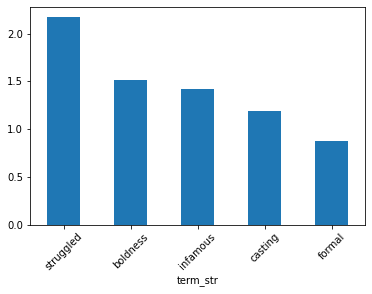

In [421]:
EIG_PAIRS.exp_var.sort_values(ascending=False).head().plot.bar(rot=45)

In [422]:
COMPS = EIG_PAIRS.sort_values('exp_var', ascending=False).head(10).reset_index(drop=True)
COMPS.index.name = 'comp_id'
COMPS.index = ["PC{}".format(i) for i in COMPS.index.tolist()]
COMPS.index.name = 'pc_id'

In [423]:
COMPS

,eig_val,her,you,she,my,me,we,will,very,can,...,uncommonly,disconcerted,token,avoiding,formal,casting,infamous,boldness,struggled,exp_var
pc_id,,,,,,,,,,,,,,,,,,,,,
PC0,0.019520,-0.018298,-0.010745,-0.022618,-0.008740,-0.008920,-0.002692,-0.001667,-0.002910,-0.003316,...,0.002875,-0.006816,0.004478,-0.001097,0.002964,2.999059e-03,0.003037,0.004814,0.001053,2.17
PC1,0.013613,0.006261,0.006055,0.003595,0.005843,0.005559,0.001578,0.003488,0.001773,0.005152,...,-0.003706,-0.007687,-0.013583,0.002869,-0.000915,-1.324061e-02,-0.003044,-0.006423,-0.006107,1.51
PC2,0.012794,-0.002401,-0.004527,0.000438,-0.007664,-0.007721,-0.002072,-0.004496,-0.000061,-0.003125,...,0.012856,0.011670,-0.010504,0.004697,0.007085,2.672784e-04,0.003343,-0.008123,0.005095,1.42
PC3,0.010667,-0.005683,-0.004689,-0.006543,-0.004768,-0.003460,-0.002384,-0.002573,-0.001601,-0.001064,...,-0.025525,-0.001473,-0.004864,-0.005135,-0.014352,1.040319e-03,-0.006207,0.001421,0.009371,1.19
PC4,0.007916,0.008085,0.004386,0.003985,0.011733,0.009731,-0.000690,-0.000483,-0.001056,0.000200,...,0.001259,-0.014329,-0.005182,-0.013665,0.004316,6.729487e-03,0.000113,-0.012013,-0.001512,0.88
PC5,0.006732,-0.003545,0.001438,-0.003182,-0.002936,-0.002361,0.000819,-0.000401,0.000654,-0.000208,...,-0.003254,-0.003957,0.005155,-0.005613,-0.015871,-4.485855e-03,-0.006360,-0.001332,-0.017964,0.75
PC6,0.006339,-0.009610,-0.003693,-0.009351,-0.006454,-0.005464,-0.002094,0.000503,-0.002114,-0.000321,...,-0.008193,-0.004202,0.004058,0.016252,-0.003065,1.138058e-02,0.009960,0.003021,-0.006470,0.70
PC7,0.005424,0.003820,0.004022,0.006601,0.005732,0.005642,0.000902,0.002028,-0.000157,0.002360,...,-0.003226,-0.012080,0.005856,0.001591,0.008645,-2.085134e-02,-0.007153,0.008422,-0.004662,0.60
PC8,0.005016,-0.002312,-0.003577,-0.001258,-0.002367,-0.001390,-0.000796,-0.000488,-0.000371,-0.000487,...,-0.002007,-0.008844,0.005370,0.010979,-0.005683,-2.276578e-03,0.003142,0.008760,-0.004864,0.56


In [424]:
LOADINGS = COMPS[COV.index].T
LOADINGS.index.name = 'term_str'

In [425]:
LOADINGS.head(10).style.background_gradient(cmap='YlGn', high=.5)

pc_id,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9
term_str,,,,,,,,,,
her,-0.018298,0.006261,-0.002401,-0.005683,0.008085,-0.003545,-0.009610,0.003820,-0.002312,-0.008052
you,-0.010745,0.006055,-0.004527,-0.004689,0.004386,0.001438,-0.003693,0.004022,-0.003577,-0.003794
she,-0.022618,0.003595,0.000438,-0.006543,0.003985,-0.003182,-0.009351,0.006601,-0.001258,-0.004187
my,-0.008740,0.005843,-0.007664,-0.004768,0.011733,-0.002936,-0.006454,0.005732,-0.002367,-0.016307
me,-0.008920,0.005559,-0.007721,-0.003460,0.009731,-0.002361,-0.005464,0.005642,-0.001390,-0.015324
we,-0.002692,0.001578,-0.002072,-0.002384,-0.000690,0.000819,-0.002094,0.000902,-0.000796,-0.000412
will,-0.001667,0.003488,-0.004496,-0.002573,-0.000483,-0.000401,0.000503,0.002028,-0.000488,0.000388
very,-0.002910,0.001773,-0.000061,-0.001601,-0.001056,0.000654,-0.002114,-0.000157,-0.000371,0.002491
can,-0.003316,0.005152,-0.003125,-0.001064,0.000200,-0.000208,-0.000321,0.002360,-0.000487,-0.002683


In [426]:
top_terms = {}
for i in [0, 1, 2, 3]:
    for j in [0, 1]:
      top_terms[f"{i}{j}"] = ' '.join(LOADINGS.sort_values(f'PC{i}', ascending=bool(j)).head(10).index.to_list())

In [427]:
top_terms

{'00': 'countries species parts commonly likewise sufficient produce labour necessarily proportion',
 '01': 'anna vronsky levin kitty alexey stepan arkadyevitch alexandrovitch dolly moscow',
 '10': 'charlotte prince states levin example necessarily elizabeth kitty agriculture acquired',
 '11': 'quixote sancho until foot knees señor top shoulders pale bade',
 '20': 'mr mrs london miss walked carriage aunt tea period sister',
 '21': 'quixote sancho señor knight thou thee errant panza dulcinea squire',
 '30': 'levin vronsky anna alexey thick simply gazed ivanovitch stepan arkadyevitch',
 '31': 'elizabeth bennet mrs jane darcy bingley miss longbourn lizzy mr'}

In [428]:
DCM = TFIDF.dot(COMPS[COV.index].T) 

In [431]:
LIB_COLS = ['author','title']

In [432]:
DCM = DCM.join(LIB[LIB_COLS], on='book_id')

In [433]:
DCM['doc'] = DCM.apply(lambda x: "{}-{}-{}".format(x.author, x.title, x.name[1]), 1)

In [434]:
DCM.iloc[:10,:10].style.background_gradient(cmap='YlGn', high=.5)

In [545]:
DCM.to_csv('{}/{}-PCA.csv'.format(data_out, data_prefix))

In [435]:
def vis_pcs(M, a, b, label='author', hover_name='doc', symbol=None, size=None):
    fig = px.scatter(M, f"PC{a}", f"PC{b}", color=label, hover_name=hover_name, 
                     symbol=symbol, size=size,
                     marginal_x='box', height=800)
    fig.show()

In [436]:
vis_pcs(DCM, 0, 1)

In [437]:
vis_pcs(DCM, 0, 1, label='title', symbol='author')

## TOPIC MODELS

In [440]:
ngram_range = [1,2]
n_terms = 4000
n_topics = 40
max_iter = 20
n_top_terms = 9

In [441]:
OHCO = ['book_id', 'chap_num', 'para_num']
PARA = OHCO[:3]
CHAP = OHCO[:2]
BOOK = OHCO[:1]

In [442]:
BAG = CHAP

In [443]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation as LDA

In [454]:
TOKENS = pd.read_csv('{}/{}-TOKEN-2.csv'.format(data_out, data_prefix))

In [455]:
TOKENS

,book_id,chap_num,para_num,sent_num,token_num,pos_tuple,pos,token_str,term_str,term_id
0,1228,1,0,0,0,"('VARIATION', 'NNP')",NNP,VARIATION,variation,45488
1,1228,1,0,0,1,"('UNDER', 'NNP')",NNP,UNDER,under,44461
2,1228,1,0,0,2,"('DOMESTICATION', 'NNP')",NNP,DOMESTICATION,domestication,14455
3,1228,1,1,0,0,"('Causes', 'NNS')",NNS,Causes,causes,8459
4,1228,1,1,0,1,"('of', 'IN')",IN,of,of,29916
...,...,...,...,...,...,...,...,...,...,...
3339829,996,126,225,1,0,"('Farewell', 'NNP')",NNP,Farewell,farewell,17299
3339830,996,126,226,0,0,"('p74e.jpg', 'NN')",NN,p74e.jpg,p74ejpg,30922
3339831,996,126,226,0,2,"('49K', 'CD')",CD,49K,49k,1362
3339832,996,126,227,0,0,"('Full', 'NNP')",NNP,Full,full,19006


In [456]:
DOCS = TOKENS[TOKENS.pos.str.match(r'^NNS?$')]\
    .groupby(BAG).term_str\
    .apply(lambda x: ' '.join(x))\
    .to_frame()\
    .rename(columns={'term_str':'doc_str'})

In [457]:
DOCS.head()

doc_str
book_id chap_num                                                   
59      1         sense things men everything measure quality po...
        2         thither wars country termination army coronati...
        3         house materials builders work plan house opera...
        4         doubt propriety meditations place matter disco...
        5         whole chain truths view questions dispute expo...

In [458]:
count_engine = CountVectorizer(max_features=n_terms, ngram_range=ngram_range, stop_words='english')
count_model = count_engine.fit_transform(DOCS.doc_str)
TERMS = count_engine.get_feature_names()

In [459]:
lda_engine = LDA(n_components=n_topics, max_iter=max_iter, learning_offset=50., random_state=0)

In [460]:
THETA = pd.DataFrame(lda_engine.fit_transform(count_model), index=DOCS.index)
THETA.columns.name = 'topic_id'

In [461]:
THETA.sample(20).style.background_gradient(cmap='GnBu', high=.5)

,topic_id,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39
book_id,chap_num,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
3296,8,0.000025,0.000025,0.000025,0.000025,0.029014,0.054654,0.012595,0.000025,0.000025,0.000025,0.000025,0.000025,0.000025,0.000025,0.000025,0.000025,0.000025,0.000025,0.000025,0.000025,0.000025,0.000025,0.000025,0.000025,0.000025,0.000025,0.000025,0.902853,0.000025,0.000025,0.000025,0.000025,0.000025,0.000025,0.000025,0.000025,0.000025,0.000025,0.000025,0.000025
2610,42,0.000025,0.000025,0.000025,0.000025,0.012706,0.078023,0.000025,0.000025,0.000025,0.000025,0.693585,0.000025,0.000025,0.000025,0.000025,0.039629,0.000025,0.000025,0.000025,0.000025,0.000025,0.088556,0.000025,0.000025,0.076756,0.000025,0.000025,0.000025,0.000025,0.000025,0.000025,0.009929,0.000025,0.000025,0.000025,0.000025,0.000025,0.000025,0.000025,0.000025
996,112,0.000033,0.000033,0.000033,0.000033,0.000033,0.208321,0.007705,0.000033,0.072143,0.000033,0.000033,0.000033,0.000033,0.000033,0.000033,0.040654,0.000033,0.000033,0.031158,0.000033,0.591774,0.000033,0.000033,0.000033,0.000033,0.003985,0.000033,0.038619,0.000033,0.000033,0.000033,0.000033,0.000033,0.004624,0.000033,0.000033,0.000033,0.000033,0.000033,0.000033
3207,14,0.000049,0.000049,0.000049,0.000049,0.000049,0.000049,0.000049,0.000049,0.000049,0.000049,0.000049,0.000049,0.000049,0.000049,0.000049,0.970541,0.000049,0.000049,0.000049,0.000049,0.000049,0.000049,0.000049,0.000049,0.000049,0.000049,0.000049,0.000049,0.000049,0.000049,0.002656,0.000049,0.000049,0.000049,0.000049,0.000049,0.004890,0.000049,0.000049,0.020161
2610,52,0.000020,0.000020,0.000020,0.000020,0.000020,0.000020,0.021344,0.000020,0.033390,0.000020,0.779769,0.000020,0.000020,0.000020,0.000020,0.083523,0.000020,0.039942,0.000020,0.000020,0.000020,0.000020,0.000020,0.000020,0.011946,0.000020,0.000020,0.000020,0.000020,0.000020,0.000020,0.029438,0.000020,0.000020,0.000020,0.000020,0.000020,0.000020,0.000020,0.000020
1399,87,0.000130,0.000130,0.000130,0.144957,0.014051,0.143099,0.000130,0.000130,0.022636,0.000130,0.000130,0.000130,0.000130,0.000130,0.535302,0.099136,0.000130,0.000130,0.000130,0.000130,0.000130,0.036546,0.000130,0.000130,0.000130,0.000130,0.000130,0.000130,0.000130,0.000130,0.000130,0.000130,0.000130,0.000130,0.000130,0.000130,0.000130,0.000130,0.000130,0.000130
2527,12,0.000610,0.000610,0.000610,0.000610,0.185993,0.280134,0.199139,0.000610,0.000610,0.000610,0.000610,0.000610,0.000610,0.000610,0.000610,0.000610,0.000610,0.000610,0.000610,0.000610,0.000610,0.000610,0.000610,0.000610,0.000610,0.000610,0.000610,0.000610,0.000610,0.000610,0.000610,0.312782,0.000610,0.000610,0.000610,0.000610,0.000610,0.000610,0.000610,0.000610
2610,4,0.000047,0.000047,0.000047,0.065252,0.204907,0.000047,0.018609,0.000047,0.022912,0.000047,0.491951,0.000047,0.000047,0.000047,0.000047,0.063758,0.000047,0.000047,0.000047,0.000047,0.000047,0.000047,0.000047,0.000047,0.109273,0.000047,0.000047,0.000047,0.000047,0.000047,0.000047,0.000047,0.000047,0.000047,0.000047,0.000047,0.021831,0.000047,0.000047,0.000047
1399,27,0.000177,0.000177,0.000177,0.000177,0.000177,0.273189,0.000177,0.000177,0.000177,0.000177,0.000177,0.000177,0.000177,0.000177,0.407558,0.000177,0.077948,0.000177,0.000177,0.000177,0.000177,0.021533,0.000177,0.117978,0.000177,0.000177,0.000177,0.000177,0.000177,0.000177,0.000177,0.000177,0.000177,0.000177,0.000177,0.095766,0.000177,0.000177,0.000177,0.000177


In [462]:
PHI = pd.DataFrame(lda_engine.components_, columns=TERMS)
PHI.index.name = 'topic_id'
PHI.columns.name  = 'term_str'

In [463]:
PHI.T.sample(10).style.background_gradient(cmap='GnBu', high=.5)

topic_id,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39
term_str,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
landlady,0.025000,0.025000,0.025000,43.981875,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,14.941350,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,16.151775,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000
footmen,0.025000,0.025000,0.025000,0.025000,1.210257,0.025000,0.025000,0.025000,1.009276,0.025000,0.025000,0.025000,0.025000,0.025000,7.423726,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,2.584955,0.025000,0.025000,0.025000,0.025000,0.025000,12.896787,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000
knowing,0.025000,0.025000,0.025000,3.145172,0.025000,23.033785,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,1.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,3.896044
kind man,1.025000,0.025000,0.025000,3.877137,0.025000,11.361998,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,3.438754,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,3.879509,2.575616,0.025000,0.025000,1.016986,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000
refuge,0.025000,0.025000,0.025000,0.025796,0.025000,21.055662,0.025000,0.025000,8.317483,0.025000,20.988972,0.025000,0.025000,0.025000,2.310605,0.025000,0.025000,5.130496,1.460750,1.097437,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,5.199827,0.025000,0.025000,0.025000,2.662974,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000
variety,11.281443,0.025000,0.025000,0.025000,0.025000,0.110416,0.025000,92.600799,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,16.470845,0.025000,7.720692,0.025000,0.025000,11.270274,0.025000,0.025000,0.025000,1.373398,19.768082,0.025000,3.634585,0.025000,0.025000,0.025000,0.025000,0.025000,3.586416,0.025000,9.256596,6.470276,0.025000,23.878096,10.928082
quixote,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,78.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000
differences,0.025000,0.025000,0.025000,0.025000,0.025000,11.667314,0.025000,136.606760,0.025000,0.025000,0.025000,0.025000,0.025000,1.549447,0.025000,8.055180,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,1.097257,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,2.373415,0.025000,0.025000,0.825626,0.025000,0.025000,0.025000
hour,0.025000,0.025000,0.025000,117.275407,4.849543,124.269301,0.025000,0.025000,0.025000,0.025000,48.075354,1.357924,1.580815,0.025000,14.216568,14.955465,0.025000,26.281191,0.025000,0.025000,35.441952,1.069557,0.025000,0.025000,0.025000,44.131458,0.025000,22.624361,0.025000,5.167170,0.025000,16.562075,39.536429,0.025000,13.148532,89.112405,0.025000,2.074456,2.857544,1.937491


In [464]:
PHI_P = (PHI.T / PHI.T.sum())
PHI_I = np.log2(1/PHI_P)
TOPIC_H = round((PHI_I * PHI_P).sum().sort_values(ascending=False), 2)

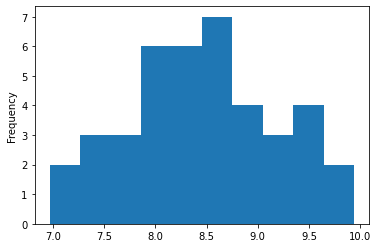

In [467]:
TOPIC_H.plot.hist();

In [468]:
THETA_I = np.log2(1/THETA.T)
DOC_H = (THETA_I * THETA.T).sum()

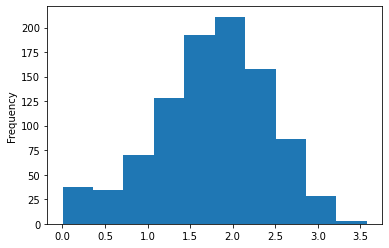

In [469]:
DOC_H.plot.hist();

In [470]:
TOPICS = PHI.stack().to_frame().rename(columns={0:'topic_weight'})\
    .groupby('topic_id')\
    .apply(lambda x: 
        x.sort_values('topic_weight', ascending=False)\
               .head(n_top_terms)\
               .reset_index()\
               .drop('topic_id',1)['term_str'])

In [471]:
TOPICS[[t for t in range(n_top_terms)]]

term_str,0,1,2,3,4,5,6,7,8
topic_id,,,,,,,,,
0,price,corn,quantity,value,silver,market,produce,land,labour
1,tax,revenue,taxes,land,rent,people,duties,expense,country
2,bank,money,trade,cent,exchange,value,goods,country,balance
3,man,time,room,door,day,way,face,moment,eyes
4,town,house,boy,shoes,flowers,people,world,day,palace
5,man,father,day,house,wife,life,friend,time,heart
6,ship,sea,men,home,way,man,wind,land,board
7,species,varieties,selection,life,case,forms,animals,nature,structure
8,men,arms,army,time,soldiers,war,enemy,city,order


In [472]:
TOPICS.stack().to_frame('term').value_counts().to_frame('n').head(5)#.sort_values('n')#.plot.barh(figsize=(5,15))

,n
term,
time,14
man,9
people,8
country,8
land,7


In [473]:
TOPICS['label'] = TOPICS.apply(lambda x: str(x.name) + ' ' + ', '.join(x[:n_top_terms]), 1)

In [474]:
TOPICS['doc_weight_sum'] = THETA.sum()

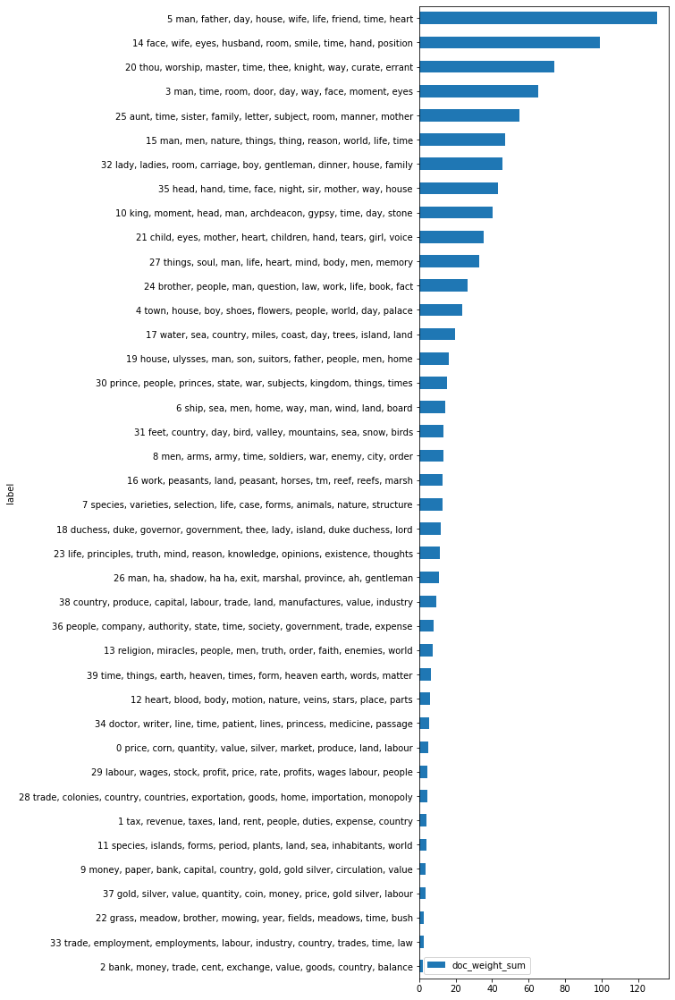

In [475]:
TOPICS.sort_values('doc_weight_sum', ascending=True).plot.barh(y='doc_weight_sum', x='label', figsize=(5,n_topics/2));

In [478]:
LIB = pd.read_csv('{}/{}-LIB.csv'.format(data_out, data_prefix)).set_index('book_id')

In [479]:
topic_cols = [t for t in range(n_topics)]
AUTHORS = THETA.join(LIB, on='book_id')\
    .reset_index().set_index(['author']+BAG)\
    .groupby('author')[topic_cols].mean()\
    .T                                            
AUTHORS.index.name = 'topic_id'

In [480]:
AUTHORS['label'] = TOPICS['label']

In [489]:
import scipy.cluster.hierarchy as sch
from scipy.spatial.distance import pdist
from sklearn.cluster import AgglomerativeClustering
from sklearn.preprocessing import normalize
import matplotlib.pyplot as plt

In [490]:
def plot_tree(tree, labels, color_thresh=1):
    plt.figure()
    fig_height = n_topics / 2
    fig, axes = plt.subplots(figsize=(5, fig_height))
    dendrogram = sch.dendrogram(tree, labels=labels, orientation="left", color_threshold=color_thresh)
    plt.tick_params(axis='both', which='major', labelsize=14)

In [491]:
SIMS = pdist(normalize(PHI), metric='cosine')
TREE = sch.linkage(SIMS, method='ward')

## WORD EMBEDDINGS

In [495]:
TOPICS.to_csv('{}/{}-TOPICS.csv'.format(data_out, data_prefix))

In [502]:
OHCO = ['book_id', 'chap_num', 'para_num', 'sent_num', 'token_num']
PARA = OHCO[:4] # Paragraphs
SENT = OHCO[:5] # Sentences
BAG = PARA

In [507]:
w2v_params = dict(
    window = 5,
    vector_size = 246,
    min_count = 50,
    workers = 4
)

In [498]:
import pandas as pd
import numpy as np
from gensim.models import word2vec
from sklearn.manifold import TSNE
import plotly_express as px

/Users/haoxuanliu/opt/anaconda3/lib/python3.8/site-packages/gensim/similarities/__init__.py:15: UserWarning:

The gensim.similarities.levenshtein submodule is disabled, because the optional Levenshtein package <https://pypi.org/project/python-Levenshtein/> is unavailable. Install Levenhstein (e.g. `pip install python-Levenshtein`) to suppress this warning.



In [503]:
DOCS = TOKENS[~TOKENS.pos.str.match('NNPS?')]\
    .groupby(BAG)\
    .term_str.apply(lambda  x:  x.tolist())\
    .reset_index()['term_str'].tolist()
DOCS = [doc for doc in DOCS if len(doc) > 1]

In [508]:
model = word2vec.Word2Vec(DOCS, **w2v_params)

In [510]:
coords = pd.DataFrame(
    dict(
        vector = [model.wv.get_vector(w) for w in model.wv.key_to_index.values()], 
        term_str = model.wv.index_to_key
    )).set_index('term_str')

In [511]:
tsne_engine = TSNE(perplexity=40, n_components=2, init='pca', n_iter=2500, random_state=23)
tsne_model = tsne_engine.fit_transform(coords.vector.to_list())

In [512]:
coords['x'] = tsne_model[:,0]
coords['y'] = tsne_model[:,1]

In [513]:
if coords.shape[1] == 3:
    coords = coords.merge(VOCAB.reset_index(), on='term_str')
    coords = coords.set_index('term_str')

In [514]:
coords = coords[coords.stop == 0]

In [548]:
px.scatter(coords.reset_index(), 'x', 'y', 
           text='term_str', 
           color='pos_max', 
           hover_name='term_str',          
           size='tfidf_max_sum',
           height=1000).update_traces(
                mode='markers+text', 
                textfont=dict(color='black', size=14, family='Arial'),
                textposition='top center')

In [550]:
coords.to_csv('{}/{}-EMBEDDINGS.csv'.format(data_out, data_prefix))

In [551]:
coords

,vector,x,y,term_id,n,num,stop,p_stem,pos_max,p,...,tfidf_jp_sum,tfidf_cp_sum,tfidf_l2_sum,tfidf_logn_sum,tfidf_sub_sum,tfidf_max_sum,tfidf_bool_sum,dfidf,dp,dpidp
term_str,,,,,,,,,,,,,,,,,,,,,
said,"[1.0435295, -0.7981819, 0.36506218, -0.1833424...",11.434782,57.566177,37347,13164,0,0,said,VBD,0.003942,...,0.010319,0.010319,0.010567,0.003890,0.004115,0.001788,0.002101,136.369080,0.894403,0.144001
one,"[-0.8336159, -0.10179888, -0.5609832, 0.040273...",-2.283711,-0.075064,30064,11766,0,0,one,CD,0.003523,...,0.003561,0.003561,0.003477,0.001652,0.001774,0.000754,0.001127,63.353767,0.952482,0.066899
would,"[0.32709125, 0.11826426, -0.31698084, -0.09420...",22.161669,51.758160,47264,9435,0,0,would,MD,0.002825,...,0.004914,0.004914,0.004915,0.002722,0.002924,0.001344,0.001832,110.397219,0.915523,0.116576
could,"[0.23619236, 0.42788085, -0.38129637, 0.771682...",23.571796,51.343895,11365,6324,0,0,could,MD,0.001894,...,0.005392,0.005392,0.005342,0.003302,0.003565,0.001824,0.002521,150.364200,0.882788,0.158780
upon,"[-0.057577897, 0.23803021, -0.21098816, -0.827...",-47.857761,24.641939,45219,5964,0,0,upon,IN,0.001786,...,0.008241,0.008241,0.008010,0.006164,0.006544,0.003686,0.004566,305.206653,0.739176,0.322288
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
scared,"[-0.05076649, 0.04723353, 0.097484425, -0.1301...",-4.706470,19.251284,37770,50,0,0,scare,JJ,0.000015,...,0.001218,0.001218,0.001237,0.001683,0.001507,0.002311,0.002573,200.728298,0.048574,0.211962
reverence,"[0.06281791, -0.018951941, -0.052319836, -0.11...",25.741457,-8.488606,36501,53,0,0,rever,NN,0.000016,...,0.000873,0.000873,0.000882,0.001714,0.001536,0.002300,0.001936,200.728298,0.048574,0.211962
defined,"[-0.043556716, 0.02860763, -0.022386167, -0.01...",7.366558,26.396397,12748,55,0,0,defin,VBN,0.000016,...,0.001011,0.001011,0.000988,0.001727,0.001625,0.002128,0.002056,185.716413,0.043295,0.196110


## SENTIMENT ANALYSIS

In [516]:
salex_csv = '{}/lexicons/salex_nrc.csv'.format(data_in)
emo_cols = "anger anticipation disgust fear joy sadness surprise trust polarity".split()

In [518]:
novels_csv = '{}/{}-TOKEN-2.csv'.format(data_out, data_prefix)
vocab_csv = '{}/{}-VOCAB-3.csv'.format(data_out, data_prefix)
lib_csv = '{}/{}-LIB.csv'.format(data_out, data_prefix)
bow_csv = '{}/{}-BOW.csv'.format(data_out, data_prefix)

In [520]:
from IPython.core.display import display, HTML

In [521]:
sns.set()

In [523]:
TOKENS = pd.read_csv(novels_csv).set_index(OHCO)
VOCAB = pd.read_csv(vocab_csv).set_index('term_id')
LIB = pd.read_csv(lib_csv).set_index('book_id')[['author','title']]
BOW = pd.read_csv(bow_csv)

In [526]:
BOW['term_id'] = BOW.term_str.map(VOCAB.reset_index().set_index('term_str').term_id)

In [528]:
BOW['term_str'] = BOW.term_id.map(VOCAB.term_str)
BOW = BOW.set_index(['book_id','chap_num','term_id'])

In [529]:
BOW.sort_index()

term_str  tf_n     tf_jp     tf_cp     tf_l2  \
book_id chap_num term_id                                                    
59      1        2016               a    27  0.010235  0.010235  0.087558   
                 2028       abandoned     1  0.000379  0.000379  0.003243   
                 2076     aberrations     1  0.000379  0.000379  0.003243   
                 2108            able     3  0.001137  0.001137  0.009729   
                 2145       abounding     1  0.000379  0.000379  0.003243   
...                               ...   ...       ...       ...       ...   
18269   14       47490          yield     1  0.000202  0.000202  0.001794   
                 47508            you    37  0.007458  0.007458  0.066384   
                 47519           your     1  0.000202  0.000202  0.001794   
                 47523     yourselves     2  0.000403  0.000403  0.003588   
                 47557           zeal     5  0.001008  0.001008  0.008971   

                           tf_logn    tf_sub    tf_max   tf_bool    tfidf_n  \
book_id chap_num term_id                                                      
59      1        2016     4.807355  5.754888  0.505195  0.001205   0.371966   
                 2028     1.000000  1.000000  0.403896  0.001205   3.677767   
                 2076     1.000000  1.000000  0.403896  0.001205   8.302258   
                 2108     2.000000  2.584963  0.411688  0.001205   4.079231   
                 2145     1.000000  1.000000  0.403896  0.001205   5.887221   
...                            ...       ...       ...       ...        ...   
18269   14       47490    1.000000  1.000000  0.401681  0.000813   3.460956   
                 47508    5.247928  6.209453  0.462185  0.000813   7.686399   
                 47519    1.000000  1.000000  0.401681  0.000813   0.523086   
                 47523    1.584963  2.000000  0.403361  0.000813   8.727317   
                 47557    2.584963  3.321928  0.408403  0.000813  24.214132   

                          tfidf_jp  tfidf_cp  tfidf_l2  tfidf_logn  tfidf_sub  \
book_id chap_num term_id                                                        
59      1        2016     0.000141  0.000141  0.001206    0.066229   0.079282   
                 2028     0.001394  0.001394  0.011927    3.677767   3.677767   
                 2076     0.003147  0.003147  0.026923    8.302258   8.302258   
                 2108     0.001546  0.001546  0.013229    2.719487   3.514886   
                 2145     0.002232  0.002232  0.019092    5.887221   5.887221   
...                            ...       ...       ...         ...        ...   
18269   14       47490    0.000698  0.000698  0.006210    3.460956   3.460956   
                 47508    0.001549  0.001549  0.013791    1.090207   1.289955   
                 47519    0.000105  0.000105  0.000939    0.523086   0.523086   
                 47523    0.001759  0.001759  0.015658    6.916235   8.727317   
                 47557    0.004881  0.004881  0.043444   12.518525  16.087521   

                          tfidf_max  tfidf_bool  
book_id chap_num term_id                         
59      1        2016      0.006960    0.000017  
                 2028      1.485436    0.004431  
                 2076      3.353250    0.010003  
                 2108      0.559791    0.001638  
                 2145      2.377825    0.007093  
...                             ...         ...  
18269   14       47490     1.390199    0.002814  
                 47508     0.096015    0.000169  
                 47519     0.210114    0.000425  
                 47523     1.760131    0.003548  
                 47557     1.977827    0.003937  

[824982 rows x 17 columns]

In [530]:
SALEX = pd.read_csv(salex_csv).set_index('term_str')
SALEX.columns = [col.replace('nrc_','') for col in SALEX.columns]
SALEX['polarity'] = SALEX.positive - SALEX.negative

In [531]:
SALEX

,anger,anticipation,disgust,fear,joy,negative,positive,sadness,surprise,trust,polarity
term_str,,,,,,,,,,,
abandon,0,0,0,1,0,1,0,1,0,0,-1
abandoned,1,0,0,1,0,1,0,1,0,0,-1
abandonment,1,0,0,1,0,1,0,1,1,0,-1
abduction,0,0,0,1,0,1,0,1,1,0,-1
aberration,0,0,1,0,0,1,0,0,0,0,-1
...,...,...,...,...,...,...,...,...,...,...,...
young,0,1,0,0,1,0,1,0,1,0,1
youth,1,1,0,1,1,0,1,0,1,0,1
zeal,0,1,0,0,1,0,1,0,1,1,1


In [532]:
V = pd.concat([VOCAB.reset_index().set_index('term_str'), SALEX], join='inner', axis=1)\
    .reset_index().set_index('term_id')

In [533]:
V.head()

,term_str,n,num,stop,p_stem,pos_max,p,s,i,h,...,anticipation,disgust,fear,joy,negative,positive,sadness,surprise,trust,polarity
term_id,,,,,,,,,,,,,,,,,,,,,
19959,good,5042,0,0,good,JJ,0.001510,662.402618,9.371565,0.014148,...,1,0,0,1,0,1,0,1,1,1
14496,don,4420,0,1,don,NNP,0.001323,755.618552,9.561514,0.012654,...,0,0,0,0,0,1,0,0,1,1
19890,god,2513,0,0,god,NNP,0.000752,1329.022682,10.376150,0.007807,...,1,0,1,1,0,1,0,0,1,1
39231,sir,2235,0,0,sir,NNP,0.000669,1494.332886,10.545286,0.007057,...,0,0,0,0,0,1,0,0,1,1
18647,found,2054,0,0,found,VBD,0.000615,1626.014606,10.667125,0.006560,...,0,0,0,1,0,1,0,0,1,1


In [534]:
BOWIDX = BOW.index
B = BOW.merge(V, on='term_str', how='left').copy()
B.index = BOWIDX
B = B.dropna()

In [538]:
bcols = ['term_str', 'term_rank', 'num', 'pos_max', 'term_rank2', 'p',  'anger', 'anticipation', 'disgust', 'fear', 'joy', 'negative', 'positive', 'sadness', 'surprise', 'trust', 'polarity']

B = B[bcols]

In [539]:
B

term_str  term_rank  num pos_max  term_rank2  \
book_id chap_num term_id                                                   
59      1        2028      abandoned     3079.0  0.0     VBN       916.0   
                 2561     admiration     2042.0  0.0      NN       858.0   
                 2677      advisable     9060.0  0.0      JJ       987.0   
                 2896      agreeable     1437.0  0.0      JJ       793.0   
                 3793         apathy    16413.0  0.0      NN      1000.0   
...                              ...        ...  ...     ...         ...   
18269   14       47138     wonderful     1279.0  0.0      JJ       767.0   
                 47191          word      298.0  0.0      NN       291.0   
                 47194         words      262.0  0.0     NNS       256.0   
                 47262        worthy      915.0  0.0      JJ       675.0   
                 47557          zeal     4656.0  0.0      NN       955.0   

                                 p  anger  anticipation  disgust  fear  joy  \
book_id chap_num term_id                                                      
59      1        2028     0.000027    1.0           0.0      0.0   1.0  0.0   
                 2561     0.000044    0.0           0.0      0.0   0.0  1.0   
                 2677     0.000006    0.0           0.0      0.0   0.0  0.0   
                 2896     0.000064    0.0           0.0      0.0   0.0  0.0   
                 3793     0.000002    0.0           0.0      0.0   0.0  0.0   
...                            ...    ...           ...      ...   ...  ...   
18269   14       47138    0.000072    0.0           0.0      0.0   0.0  1.0   
                 47191    0.000345    0.0           0.0      0.0   0.0  0.0   
                 47194    0.000405    1.0           0.0      0.0   0.0  0.0   
                 47262    0.000101    0.0           0.0      0.0   0.0  0.0   
                 47557    0.000015    0.0           1.0      0.0   0.0  1.0   

                          negative  positive  sadness  surprise  trust  \
book_id chap_num term_id                                                 
59      1        2028          1.0       0.0      1.0       0.0    0.0   
                 2561          0.0       1.0      0.0       0.0    1.0   
                 2677          0.0       1.0      0.0       0.0    1.0   
                 2896          0.0       1.0      0.0       0.0    1.0   
                 3793          1.0       0.0      1.0       0.0    0.0   
...                            ...       ...      ...       ...    ...   
18269   14       47138         0.0       1.0      0.0       1.0    1.0   
                 47191         0.0       1.0      0.0       0.0    1.0   
                 47194         1.0       0.0      0.0       0.0    0.0   
                 47262         0.0       1.0      0.0       0.0    1.0   
                 47557         0.0       1.0      0.0       1.0    1.0   

                          polarity  
book_id chap_num term_id            
59      1        2028         -1.0  
                 2561          1.0  
                 2677          1.0  
                 2896          1.0  
                 3793         -1.0  
...                            ...  
18269   14       47138         1.0  
                 47191         1.0  
                 47194        -1.0  
                 47262         1.0  
                 47557         1.0  

[110774 rows x 17 columns]

In [544]:
B.to_csv('{}/{}-SENTIMENT.csv'.format(data_out, data_prefix))

<AxesSubplot:>

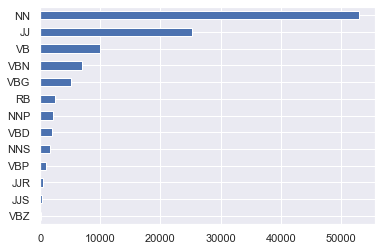

In [540]:
B.pos_max.value_counts().sort_values().plot.barh()

In [541]:
EMO_BOOKS = B.groupby(['book_id'])[emo_cols].mean()
EMO_CHAPS = B.groupby(['book_id','chap_num'])[emo_cols].mean()

In [542]:
EMO_BOOKS.index = LIB.title #book_title

<AxesSubplot:xlabel='title'>

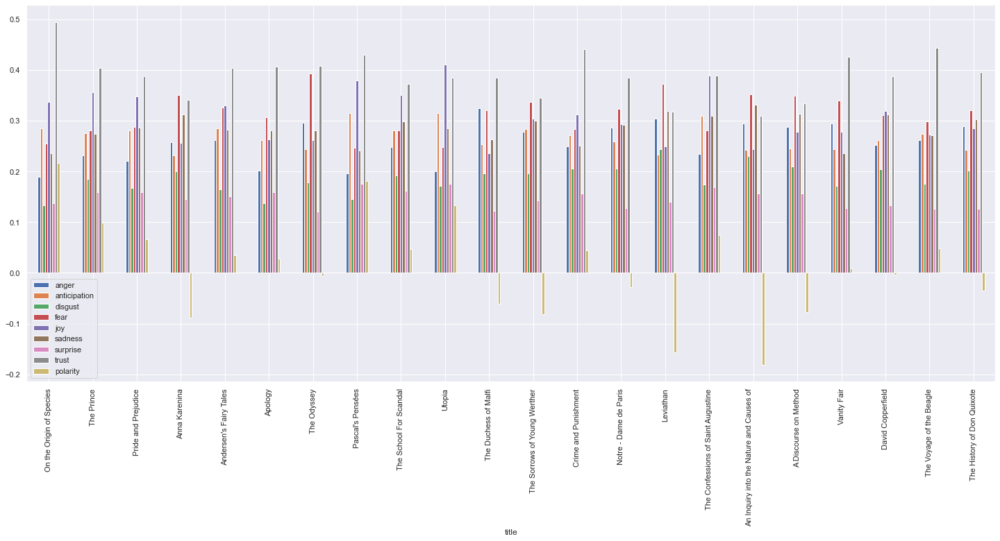

In [543]:
EMO_BOOKS.plot.bar(figsize=(25,10))